In [1]:
import pandas as pd #the csv reading library
import matplotlib as mpl
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns
from scipy.optimize import curve_fit


In [2]:
df_meta = pd.read_csv('../Dissertation_projects/Data/meta_data.csv', sep=',', index_col=0)

#fix date time 
df_meta['date_time'] = pd.to_datetime(df_meta['Date'])
df_meta['Date'] = df_meta['date_time'].dt.date

df_meta

,Date,Trip,Station,Lat,Lon,Water_depth,Sample_depth,Sample_depth_units,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time
Sample,,,,,,,,,,,,,,,,,
214371,2021-10-25,GOM21FA,St.5B,NaN,NaN,NaN,NaN,CM,0.010,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.846576,2021-10-25
214671,2021-10-27,GOM21FA,St.MK,NaN,NaN,NaN,2,CM,0.010,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214672,2021-10-27,GOM21FA,St.MK,NaN,NaN,NaN,4,CM,0.010,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214673,2021-10-27,GOM21FA,St.MK,NaN,NaN,NaN,6,CM,0.010,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214674,2021-10-27,GOM21FA,St.MK,NaN,NaN,NaN,8,CM,0.010,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225354,2022-07-24,GOM22SU,St.MK,NaN,NaN,NaN,NA,M,0.489,10.166667,0.053721,LANDSYR,LWCC 50 CM #2,BC14,NaN,36.007597,2022-07-24
225355,2022-07-24,GOM22SU,St.MK,NaN,NaN,NaN,NA,M,0.489,10.933333,0.053721,LANDSYR,LWCC 50 CM #2,BC15,NaN,36.007597,2022-07-24
225356,2022-07-24,GOM22SU,St.MK,NaN,NaN,NaN,NA,M,0.489,11.700000,0.053721,LANDSYR,LWCC 50 CM #2,BC16,NaN,36.007597,2022-07-24


In [3]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_RZ.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

wavelengths = list(range(250, 751))
df = df.drop('file_id', axis = 1)

df.columns = ['a' + col for col in df.columns]

trips = ['GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

df_cdom = df.join(df_meta)

df_cdom['Sample_depth'] = pd.to_numeric(df_cdom['Sample_depth'], errors='coerce')

df_cdom

,a250,a251,a252,a253,a254,a255,a256,a257,a258,a259,...,Sample_depth_units,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time
Sample_ID,,,,,,,,,,,,,,,,,,,,,
214671,21.640390,21.879214,21.895531,21.518562,20.883431,20.264949,20.130483,19.476630,19.085173,18.482420,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214671,21.910959,22.210836,21.709168,21.711604,20.995161,20.489458,20.124740,19.700331,19.217653,18.722689,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214671,21.374693,22.185172,21.605903,21.514370,21.038923,20.402961,20.182216,19.340749,19.195943,18.565685,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214673,16.759064,17.221450,16.871734,16.963751,16.418903,15.870973,15.566538,15.287167,14.808327,14.452342,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
214673,17.286577,17.491085,16.946389,16.842589,16.166835,16.040394,15.742164,15.272798,15.012614,14.558740,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,31.447235,2021-10-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225364,23.236458,23.080618,22.754803,22.568588,22.398229,22.159297,22.169553,22.028464,21.851306,21.735173,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225364,23.253490,22.891281,22.635961,22.435934,22.146136,22.054451,21.896551,21.770392,21.666365,21.425519,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225365,18.873929,18.736834,18.400028,18.223563,17.911654,17.840619,17.822796,17.730461,17.647505,17.624540,...,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23


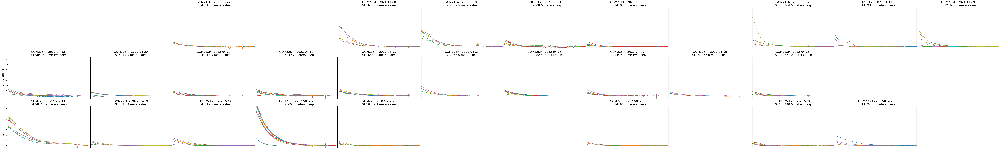

In [4]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        
        plotted = False  # Flag to check if something has been plotted

        # If any data exists for this combination
        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                cdom_abs = row[:501]  # Limit to the first 501 values
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                wavelengths = np.asarray(wavelengths, dtype=float).ravel()
                date = row["Date"] 
                # Plot all rows in subset_df against wavelengths
                axes[i, j].plot(wavelengths, cdom_abs)  # use cdom_abs.values[0] to get the values of the row
                plotted = True
            axes[i,j].set_ylim(-10,150)
            axes[i,j].set_xlim(260,725)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size =25)
        else: 
            axes[i, j].axis('off')  # Turn off the axis if no data for that combination

            
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

plt.tight_layout()
fig.set_facecolor('w')
plt.show()

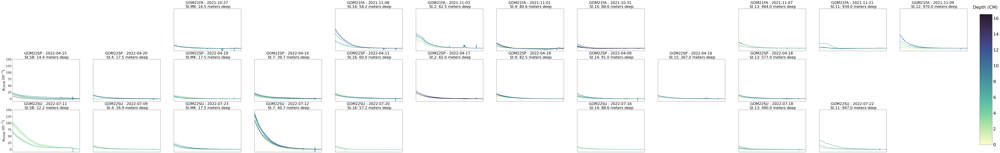

In [5]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['Sample_depth'].max())
                color = cmap(norm(row["Sample_depth"]))
                axes[i, j].plot(wavelengths, cdom_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-10,150)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['Sample_depth'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Depth (CM) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_spectra.png")

plt.show()

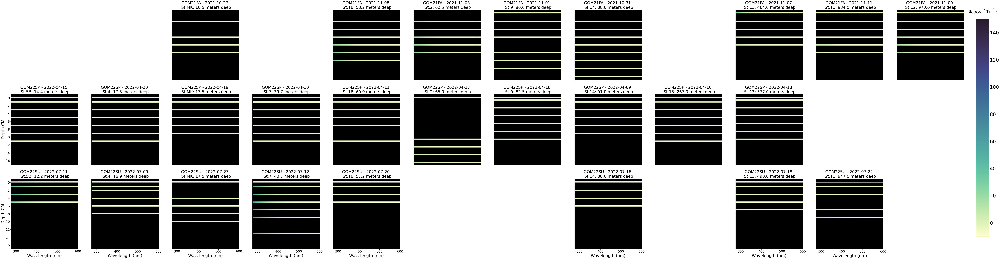

In [6]:
#Setup the CDOM heat map

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*9, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-10, vmax=300)
                color = cmap(norm(cdom_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='grey', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=-10, vmax=150)), cax=cbar_ax)
cbar.ax.set_title(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map.png")

plt.show()

In [7]:
#create the data for the normalization 
min_abs = df_cdom.iloc[:,:501].min().values
max_abs = df_cdom.iloc[:,:501].max().values

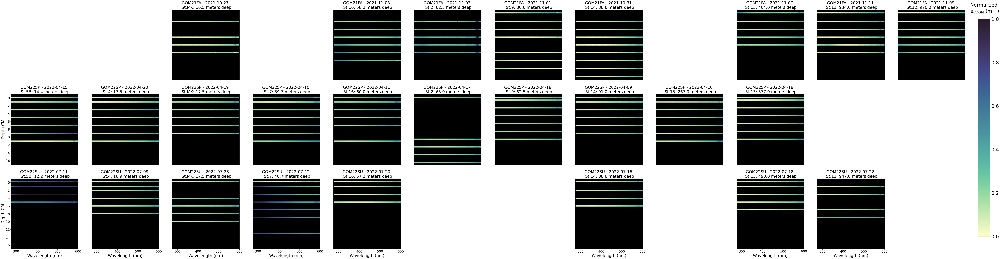

In [8]:
#Setup the CDOM heat map with normalization 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*9, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                norm_abs = (cdom_abs-min_abs)/(max_abs-min_abs)
                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=0, vmax=1)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=1)), cax=cbar_ax)
cbar.ax.set_title(r'Normalized'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_normalized_global.png")

plt.show()

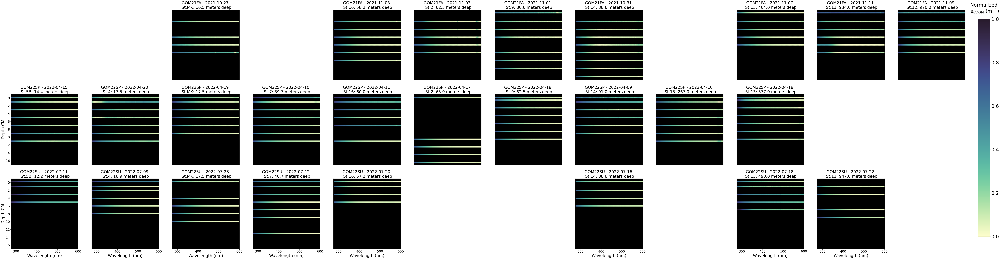

In [9]:
#Setup the CDOM heat map with normalization local 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*9, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                norm_abs = (cdom_abs-cdom_abs.min())/(cdom_abs.max()-cdom_abs.min())
                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=0, vmax=1)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=1)), cax=cbar_ax)
cbar.ax.set_title(r'Normalized'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_normalized_local.png")

plt.show()

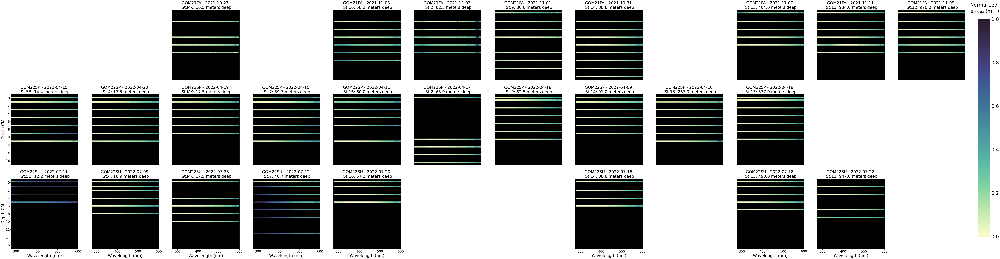

In [10]:
#Setup the CDOM heat map with normalization global and local 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*9, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                norm_abs_g = (cdom_abs-min_abs)/(max_abs-min_abs)
                norm_abs = (norm_abs_g-norm_abs_g.min())/(norm_abs_g.max()-norm_abs_g.min())
                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=0, vmax=1)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=1)), cax=cbar_ax)
cbar.ax.set_title(r'Normalized'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_normalized_local_global.png")

plt.show()

C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
  norm_abs = np.log(cdom_abs)
C:\Users\hmlbr\AppData\Local\Temp\ipykernel_19960\1436803051.py:17: RuntimeWarning: invalid value encountered in log
 

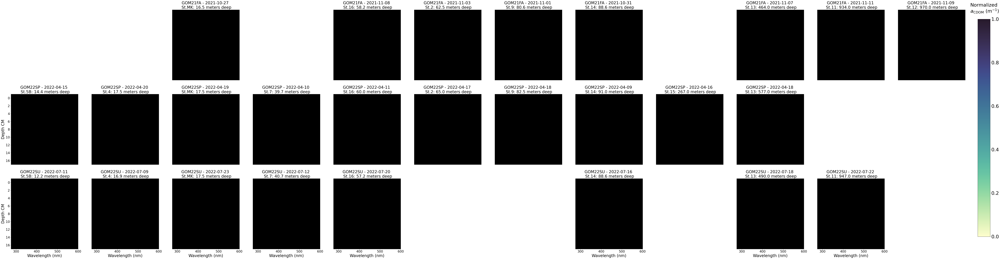

In [11]:
#Setup the CDOM heat map with normalization global and local 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*9, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                norm_abs = np.log(cdom_abs)
                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=norm_abs.min(), vmax=norm_abs.max())
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=1)), cax=cbar_ax)
cbar.ax.set_title(r'Normalized'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_LOG.png")

plt.show()

In [12]:
##DEFINE EXPONENTAL REGRESSION 
#A(g)=Ae^slope
def exp_equation(x, a, s, b):
    return a * np.exp(-s * x) + b

#DEFINE HYPERBOLIC REGRESSION 
#A(g)=A(wl/532)^slope
def hyp_equation(x, a, s, b):
    return a * ((x/532)**-s) + b

#DEFINE POWER LAW REGRESSION 
def power_law(x, a, b):
    return a * (x**b)

print("the functions are set") 

the functions are set


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

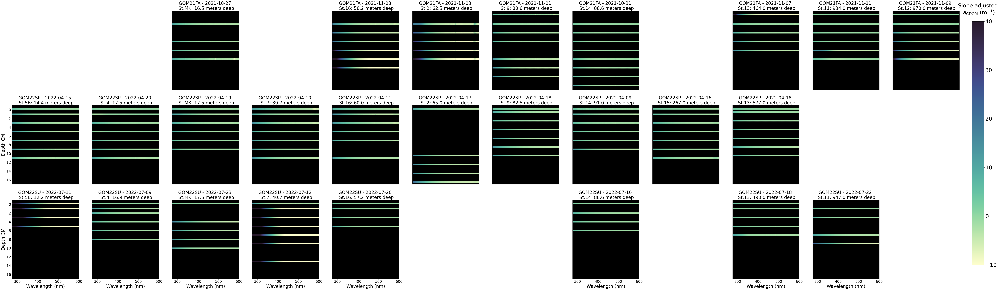

In [13]:
#Setup the CDOM heat map with normalization 

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
vmin = -10
vmax = 40


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*8, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(exp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - exp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=vmin, vmax=vmax)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
cbar.ax.set_title(r'Slope adjusted'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_slope_adgusted_SEM.png")

plt.show()

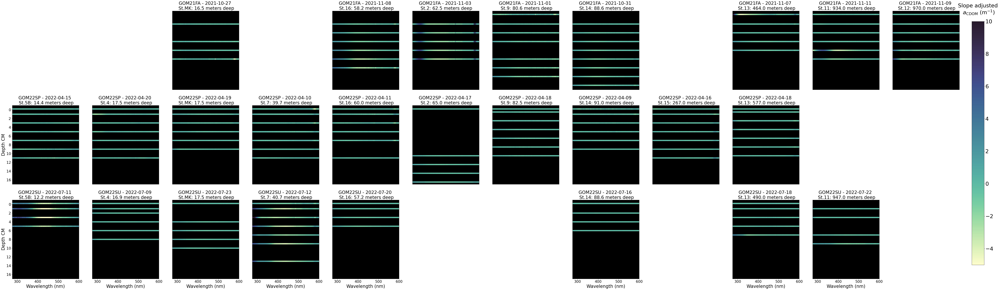

In [14]:
#Setup the CDOM heat map with normalization 

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
vmin = -5
vmax = 10

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*8, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.01, 11, 0)
                params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=vmin, vmax=vmax)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
cbar.ax.set_title(r'Slope adjusted'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_slope_adgusted_HM.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


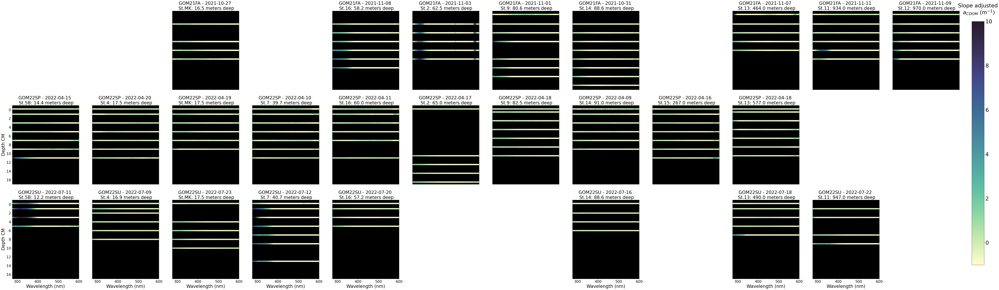

In [15]:
#Setup the CDOM heat map with normalization 

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
vmin = -1
vmax = 10

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*8, len(trips)*9))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (1, 0)
                params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                                
                depth = row["Sample_depth"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=vmin, vmax=vmax)
                color = cmap(norm(norm_abs))
                
                #plot
                axes[i, j].scatter(wavelengths, depth, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(17,-1)
            axes[i,j].set_xlim(275,600)
            axes[i, j].set_facecolor('black')
            axes[i,j].axhline(y=0, color='black', linestyle='-')
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'Depth CM', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 2:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
cbar.ax.set_title(r'Slope adjusted'+'\n'+' $a_{\mathrm{CDOM}}$ (m$^{-1}$)'+'\n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/Spectra_and_heat_maps/Rhizon_CDOM_heat_map_slope_adgusted_PL.png")

plt.show()